In [1]:
!pip freeze > ..//requirements.txt

In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
from statsmodels.tsa.stattools import (adfuller, 
                                       acf, pacf)
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.metrics import (mean_absolute_error, 
                             mean_squared_error, 
                             mean_absolute_percentage_error,
                             r2_score)
from sklearn.model_selection import TimeSeriesSplit

from plotly import express as px
from plotly import graph_objects as go
from plotly import offline as pyo

from prophet.plot import plot_plotly, plot_components_plotly
from prophet import Prophet

# hyperparameters tuning
from hyperopt import STATUS_OK, STATUS_FAIL, Trials, fmin, hp, tpe, space_eval

from hyperopt import space_eval
from indicators import Indicators, generate_graph


In [8]:
# deixar data como indice
df = pd\
    .read_csv('../data/raw/dados_ibovespa.csv')\
    .rename(columns={
          'Data':'Date'
        , 'Último':'Close'
        , 'Abertura':'Open'
        , 'Máxima':'High'
        , 'Mínima':'Low'
        , 'Vol.':'Volume'
    })
df['Adj Close'] =  df['Close']
df.Date = pd.to_datetime(df['Date']).dt.date
df = df.sort_values(['Date'])
df['Datetime'] = pd.to_datetime(df['Date'])
df.Open = df.Open.astype(float)
df.Close = df.Close.astype(float)
df.High = df.High.astype(float)
df.Low = df.Low.astype(float)
df.Volume = df.Volume.str.replace('M','000000').str.replace(',','').str.replace('K','000')
df.Volume = df.Volume.astype(float)
df['Base Volume'] = df.Volume.astype(float)
df = df.sort_values(['Datetime'])

C:\Users\Pehls\AppData\Local\Temp\ipykernel_17804\3067610310.py:13: UserWarning: Parsing dates in %d.%m.%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  df.Date = pd.to_datetime(df['Date']).dt.date


# Grafico historico

In [9]:
len(df)

5589

In [10]:
min(df.Date), max(df.Date)

(datetime.date(2000, 12, 27), datetime.date(2023, 7, 21))

In [11]:
indicators = Indicators(settings='')

df, crossovers, ma_crossovers, bb_crossovers, hammers, suportes, resistencias, high_trend, low_trend, close_trend =  indicators.gen_all(df, 9999, macd_rsi_BB=False, rsi_window=14)

generate_graph(df, crossovers, just_candles=False)

One way to test whether a time series is stationary is to perform an augmented Dickey-Fuller test, which uses the following null and alternative hypotheses:

H0: The time series is non-stationary. In other words, it has some time-dependent structure and does not have constant variance over time.

HA: The time series is stationary.

In [12]:
# serie e estacionaria? ADF - augmented dick-fuller
adfuller(df['Close'])

(-0.8924999370250177,
 0.7904322608539279,
 11,
 5577,
 {'1%': -3.4315230881147225,
  '5%': -2.862058389900819,
  '10%': -2.5670459375427312},
 16097.395332513242)

Test statistic was -1.624398
P-value was 0.47

so, we fail to reject the null hypothesis - or, we dont have constant variance over time, since this time series is non-stationary

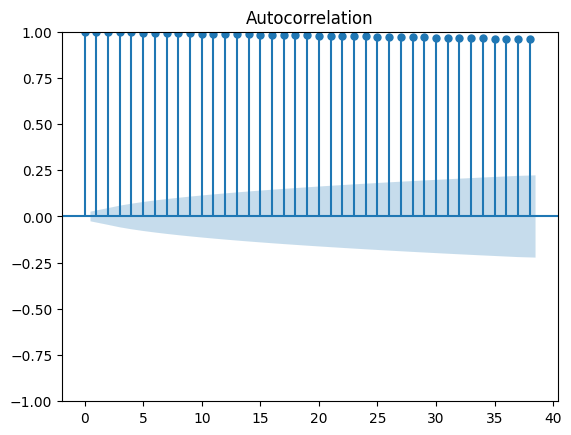

In [13]:
# ACF / PACF - autocorrelação e autocorrelação parcial 
# https://analyticsindiamag.com/what-are-autocorrelation-and-partial-autocorrelation-in-time-series-data/
acf_plot = plot_acf(df['Close'])

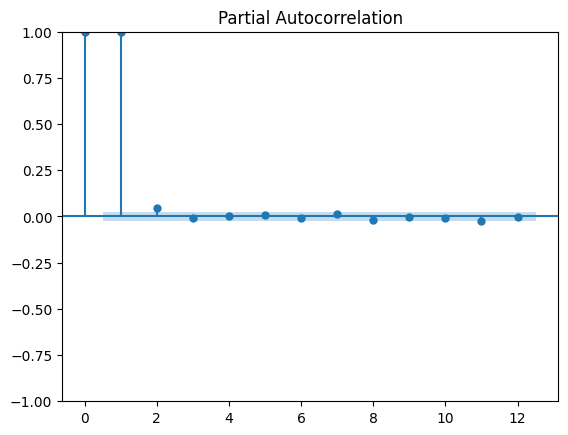

In [14]:
pacf_plot = plot_pacf(df['Close'], lags=12)

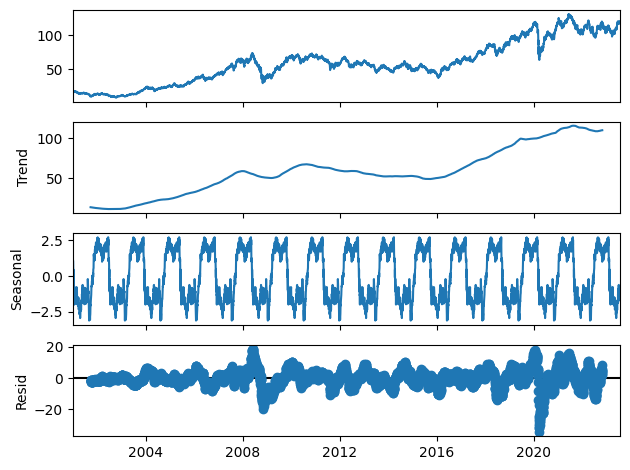

In [15]:
# componentes da serie
series = df[['Close']]
series.index = pd.to_datetime(df.Date)
result = seasonal_decompose(series, model='additive', period=365)
result_plot = result.plot()


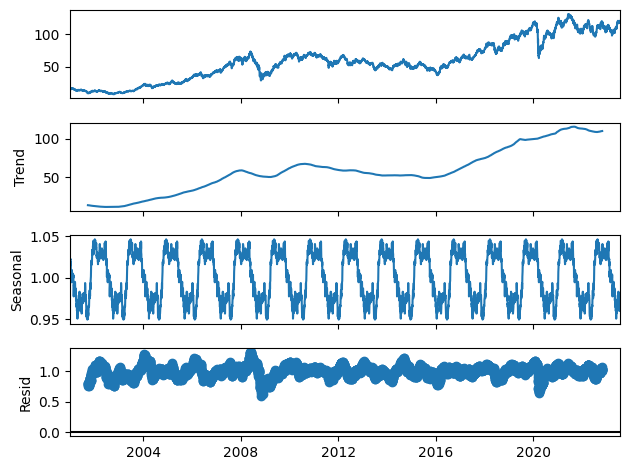

In [16]:
# componentes da serie - mult
series = df[['Close']]
series.index = pd.to_datetime(df.Date)
result = seasonal_decompose(series, model='multiplicative', period=365)
result_plot = result.plot()


In [17]:
# normalização, como diferenciação, logaritmica ou com raízes

In [18]:
# previsao com arima

In [20]:
# Prophet puro
_model = Prophet()
_res = []

_df = df.reset_index(drop=True)[['Date','Close']].rename(columns={'Date':'ds', 'Close':'y'})

train_end = pd.to_datetime('2023-01-01').date()
X_train = _df.loc[_df.ds < train_end]
X_test = _df.loc[_df.ds >= train_end]

_model.fit(X_train)
forecast_ = _model.predict(X_train)
pred = _model.predict(X_test)
_df = pd.concat([_df, _model.predict(_df)])

_res.append({
    'n_splits':0,
    'test_size':len(X_test),
    'regressors':'',
    'train_index':0,
    'test_index':min(X_test.index),
    'max_date_train':max(X_train.ds),
    'max_date_test':max(X_test.ds),
    'test_mape':mean_absolute_percentage_error(X_test['y'].values, pred['yhat'].values),
    'all_series_mape':mean_absolute_percentage_error(X_train['y'].values, forecast_["yhat"].values)
})
_res

22:39:51 - cmdstanpy - INFO - Chain [1] start processing
22:39:52 - cmdstanpy - INFO - Chain [1] done processing


[{'n_splits': 0,
  'test_size': 139,
  'regressors': '',
  'train_index': 0,
  'test_index': 5450,
  'max_date_train': datetime.date(2022, 12, 29),
  'max_date_test': datetime.date(2023, 7, 21),
  'test_mape': 0.10955756557476391,
  'all_series_mape': 0.07545745547605724}]

In [21]:
plot_plotly(_model, forecast_)

In [22]:
plot_components_plotly(_model, forecast_)

In [23]:
# previsao com prophet + BCB como external variables

# hiperparametrização 

- time series split (sklearn) + bayesian search (hyperopt)

Select the search algorithm
The two main choices are:

* hyperopt.tpe.suggest: [Tree of Parzen Estimators](https://towardsdatascience.com/a-conceptual-explanation-of-bayesian-model-based-hyperparameter-optimization-for-machine-learning-b8172278050f#:~:text=The%20Tree%20Parzen%20Estimator%20is,will%20explore%20in%20further%20articles.), a Bayesian approach that iteratively and adaptively selects new hyperparameter settings to explore based on previous results

* hyperopt.rand.suggest: Random search, a non-adaptive approach that samples over the search spac

https://facebook.github.io/prophet/docs/diagnostics.html#hyperparameter-tuning

In [24]:
# deixar data como indice
df = pd\
    .read_csv('../data/raw/dados_ibovespa.csv')\
    .rename(columns={
          'Data':'Date'
        , 'Último':'Close'
        , 'Abertura':'Open'
        , 'Máxima':'High'
        , 'Mínima':'Low'
        , 'Vol.':'Volume'
    })
df['Adj Close'] =  df['Close']
df.Date = pd.to_datetime(df['Date']).dt.date
df = df.sort_values(['Date'])
df['Datetime'] = pd.to_datetime(df['Date'])
df.Open = df.Open.astype(float)
df.Close = df.Close.astype(float)
df.High = df.High.astype(float)
df.Low = df.Low.astype(float)
df.Volume = df.Volume.str.replace('M','000000').str.replace(',','').str.replace('K','000')
df.Volume = df.Volume.astype(float)
df['Base Volume'] = df.Volume.astype(float)
df = df.sort_values(['Datetime'])

_df = df.reset_index(drop=True)[['Date','Close']].rename(columns={'Date':'ds', 'Close':'y'})

_df['ds'] = pd.to_datetime(_df['ds'])
_df = _df.reset_index()[['ds','y']]

_df = df.reset_index(drop=True)[['Date','Close']].rename(columns={'Date':'ds', 'Close':'y'})

train_end = pd.to_datetime('2023-01-01').date()
X_train = _df.loc[_df.ds < train_end]
X_test = _df.loc[_df.ds >= train_end]


C:\Users\Pehls\AppData\Local\Temp\ipykernel_17804\3609833058.py:13: UserWarning:

Parsing dates in %d.%m.%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.



In [2]:
test_size = 31
print(f"""Como vamos executar um cross validation utilizando o time series split, 
      e temos {df.dropna().size} linhas, optando por uma base de teste de 30 dias 
      (aproximadamente 1 mês), podemos executar até {df.dropna().size/test_size} splits, 
      porém, devido a limitação de tempo, vamos optar por {5} splits!"""
)

NameError: name 'df' is not defined

In [26]:
# previsao com prophet


# cross validation 
def _run_cv_prophet(df_model, params, n_splits = 5, test_size = 12,):
    # Prevenindo logs do cmdstanpy
    import warnings
    import logging
    warnings.filterwarnings('ignore')
    logging.getLogger('fbprophet').setLevel(logging.ERROR) 
    logging.getLogger('prophet').setLevel(logging.ERROR) 
    logging.getLogger('hyperopt.tpe').setLevel(logging.ERROR) 
    logging.getLogger('cmdstanpy').setLevel(logging.ERROR)
    _res = []
    tscv =  TimeSeriesSplit(n_splits=n_splits, test_size=test_size)
    for train_index, test_index in tscv.split(df_model):
        X_train, X_test = df_model.iloc[train_index], df_model.iloc[test_index]
        y_train, y_test = df_model.y[train_index], df_model.y[test_index]
        hyper_model = Prophet(
                yearly_seasonality=params['yearly_seasonality'],
                daily_seasonality=params['daily_seasonality'],
                weekly_seasonality=params['weekly_seasonality'],
                seasonality_mode=params['seasonality_mode'],
                seasonality_prior_scale=params['seasonality_prior_scale'],
                changepoint_prior_scale=params["changepoint_prior_scale"],
                changepoint_range=params["changepoint_range"],
                holidays_prior_scale=params['holidays_prior_scale']
                )
        # adicionando feriados na execução do modelo
        hyper_model.add_country_holidays(country_name='BR')
        str_regressors = ''
        for reg in params['regressors']:
            str_regressors += f'{reg["regressor_name"]}_'
            hyper_model.add_regressor(reg["regressor_name"], prior_scale=reg["prior_scale"], mode=reg["mode"])
        hyper_model.fit(X_train)
        forecast_ = hyper_model.predict(X_train)
        pred = hyper_model.predict(X_test)
        
        _res.append({
            'n_splits':n_splits,
            'test_size':test_size,
            'regressors':str_regressors,
            'train_index':train_index,
            'test_index':test_index,
            'max_date_train':max(X_train.ds),
            'max_date_test':max(X_test.ds),
            'test_mape':mean_absolute_percentage_error(y_test, pred['yhat'].values),
            'all_series_mape':mean_absolute_percentage_error(y_train, forecast_["yhat"].values)
        })
    return _res, pd.DataFrame(_res).test_mape.mean()

# definição da função objetivo a ser otimizada usando bayesian search (algoritmo tpe)
def objective(params):
   
    metrics, cv_mape = _run_cv_prophet(
                    df_model=X_train.dropna(),
                    params=params,
                    n_splits=5, test_size=test_size
                   )
    return {
                'loss':cv_mape
                , 'status': STATUS_OK
            }

space = {
    'yearly_seasonality':365
    , 'daily_seasonality':True
    , 'weekly_seasonality':True
    , 'seasonality_mode' : hp.choice('seasonality_mode', ['multiplicative','additive'])
    , "seasonality_prior_scale": hp.uniform("seasonality_prior_scale", 0.01, 10)
    , "changepoint_prior_scale": hp.uniform("changepoint_prior_scale", 0.001, 0.5)
    , "changepoint_range": hp.uniform("changepoint_range", 0.08, 0.95)
    , 'holidays_prior_scale' : hp.uniform('holidays_prior_scale', 0.01,10)
    , "regressors":''
    # , "regressors": hp.choice("regressors", [[{"regressor_name": reg,
    #                                          "prior_scale": hp.uniform(reg + "_prior_scale", 0.01, 10),
    #                                          "mode": hp.choice(reg + "_mode", ['multiplicative','additive'])
    #                                          } for reg in regressors]])
}

trials = Trials() # see https://medium.com/doma/visualizing-hyperparameter-optimization-with-hyperopt-and-plotly-states-title-26369b020b5b
best = fmin(fn=objective, space=space, algo=tpe.suggest, trials=trials, max_evals=50, verbose=1)

100%|██████████| 50/50 [2:06:13<00:00, 151.47s/trial, best loss: 0.045589674369673525]  


In [27]:
best_params = space_eval(space, best)
print(best_params)

hyper_model = Prophet(
    yearly_seasonality=best_params["yearly_seasonality"],
    daily_seasonality=best_params["daily_seasonality"],
    weekly_seasonality=best_params["weekly_seasonality"],
    seasonality_mode=best_params['seasonality_mode'],
    seasonality_prior_scale=best_params['seasonality_prior_scale'],
    changepoint_prior_scale=best_params["changepoint_prior_scale"],
    changepoint_range=best_params["changepoint_range"],
    holidays_prior_scale=best_params['holidays_prior_scale'])

for reg in best_params["regressors"]:
    hyper_model.add_regressor(reg["regressor_name"], prior_scale=reg["prior_scale"], mode=reg["mode"])
    
hyper_model.add_country_holidays(country_name='BR')
        

hyper_model.fit(X_train)
pred = hyper_model.predict(X_test)
forecast_ = hyper_model.predict(_df)

print('-'*80)

test_y = X_test.loc[(X_test['ds'] >= train_end)]["y"].values
pred_yhat = pred.loc[(pd.to_datetime(pred['ds']) >= pd.to_datetime(train_end))]["yhat"].values
test_period_mape = mean_absolute_percentage_error(X_test['y'].values, pred['yhat'].values)
print('Test period MAPE:' + f'{round(test_period_mape * 100, 3)}'+'%')

all_series_mape = mean_absolute_percentage_error(_df['y'].values, forecast_['yhat'].values)
print('All series MAPE:' + f'{round(all_series_mape * 100, 3)}'+'%')

{'changepoint_prior_scale': 0.11080321154385757, 'changepoint_range': 0.5023179998006887, 'daily_seasonality': True, 'holidays_prior_scale': 6.716189848343673, 'regressors': '', 'seasonality_mode': 'additive', 'seasonality_prior_scale': 8.725888721660423, 'weekly_seasonality': True, 'yearly_seasonality': 365}
--------------------------------------------------------------------------------
Test period MAPE:7.337%
All series MAPE:11.723%


In [28]:
plot_plotly(hyper_model, forecast_)

## Show trials 

In [ ]:
# This is a simple helper function that allows us to fill in `np.nan` when a particular
# hyperparameter is not relevant to a particular trial.
def unpack(x):
    if x:
        return x[0]
    return np.nan


# We'll first turn each trial into a series and then stack those series together as a dataframe.
trials_df = pd.DataFrame([pd.Series(t["misc"]["vals"]).apply(unpack) for t in trials])
# Then we'll add other relevant bits of information to the correct rows and perform a couple of
# mappings for convenience
trials_df["loss"] = [t["result"]["loss"] for t in trials]
trials_df["trial_number"] = trials_df.index

In [ ]:
fig = go.Figure(
    data=go.Contour(
        z=trials_df.loc[:, "loss"],
        x=trials_df.loc[:, "gradient_boosting_regressor__learning_rate"],
        y=trials_df.loc[:, "gradient_boosting_regressor__n_estimators"],
        contours=dict(
            showlabels=True,  # show labels on contours
            labelfont=dict(size=12, color="white",),  # label font properties
        ),
        colorbar=dict(title="loss", titleside="right",),
        hovertemplate="loss: %{z}<br>learning_rate: %{x}<br>n_estimators: %{y}<extra></extra>",
    )
)

fig.update_layout(
    xaxis_title="learning_rate",
    yaxis_title="n_estimators",
    title={
        "text": "learning_rate vs. n_estimators | max_depth == 3",
        "xanchor": "center",
        "yanchor": "top",
        "x": 0.5,
    },
)

# Add external regressors

In [61]:
# rsi, macd, bandas bollinger
# deixar data como indice
df = pd\
    .read_csv('../data/raw/dados_ibovespa.csv')\
    .rename(columns={
          'Data':'Date'
        , 'Último':'Close'
        , 'Abertura':'Open'
        , 'Máxima':'High'
        , 'Mínima':'Low'
        , 'Vol.':'Volume'
    })
df['Close'] = df.Close.shift(1) # realizando shift para nao utilizar dados do dia sendo previsto nos indicadores
df['Volume'] = df.Volume.shift(1) # realizando shift para nao utilizar dados do dia sendo previsto nos indicadores
df['Adj Close'] =  df['Close']
df.Date = pd.to_datetime(df['Date']).dt.date
df = df.sort_values(['Date'])
df['Datetime'] = pd.to_datetime(df['Date'])
df.Open = df.Open.astype(float)
df.Close = df.Close.astype(float)
df.High = df.High.shift(1).astype(float)
df.Low = df.Low.shift(1).astype(float)
df.Volume = df.Volume.str.replace('M','000000').str.replace(',','').str.replace('K','000')
df.Volume = df.Volume.astype(float)
df['Base Volume'] = df.Volume.astype(float)
df = df.sort_values(['Datetime'])


from indicators import Indicators, generate_graph
indicators = Indicators(settings='')

df, crossovers, _, _, _, _, _, _, _, _ =  indicators.gen_all(df, 9999, macd_rsi_BB=False, rsi_window=14)

generate_graph(df, crossovers, just_candles=False)

C:\Users\Pehls\AppData\Local\Temp\ipykernel_32436\551259113.py:16: UserWarning:

Parsing dates in %d.%m.%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.



In [65]:
global regressors
regressors=['RSI',
            'EMA_Short','EMA_Long','12MME','9MME','26MME','MACD','MACD_Signal_line','MACD_Histogram',
            'Standard_Deviation','Middle_Band','Upper_Band','Lower_Band'
            ]

_df = df.dropna().reset_index(drop=True)[['Date','Close', 'Adj Close'] + regressors].rename(columns={'Date':'ds', 'Close':'y'})

_df['ds'] = pd.to_datetime(_df['ds'])

train_end = pd.to_datetime('2023-01-01')
X_train = _df.loc[_df.ds < train_end].reset_index(drop=True)
X_test = _df.loc[_df.ds >= train_end].reset_index(drop=True)


In [34]:
# previsao com prophet


# definição da função objetivo a ser otimizada usando bayesian search (algoritmo tpe)
def objective(params):
   
    metrics, cv_mape = _run_cv_prophet(
                    df_model=X_train.dropna(),
                    params=params,
                    n_splits=5, test_size=test_size
                   )
    return {
                'loss':cv_mape
                , 'status': STATUS_OK
            }

space = {
    'yearly_seasonality':365
    , 'daily_seasonality':True
    , 'weekly_seasonality':True
    , 'seasonality_mode' : hp.choice('seasonality_mode', ['multiplicative','additive'])
    , "seasonality_prior_scale": hp.uniform("seasonality_prior_scale", 0.01, 10)
    , "changepoint_prior_scale": hp.uniform("changepoint_prior_scale", 0.001, 0.5)
    , "changepoint_range": hp.uniform("changepoint_range", 0.08, 0.95)
    , 'holidays_prior_scale' : hp.uniform('holidays_prior_scale', 0.01,10)
    , "regressors":''
    , "regressors": hp.choice("regressors", [[{"regressor_name": reg,
                                             "prior_scale": hp.uniform(reg + "_prior_scale", 0.01, 10),
                                             "mode": hp.choice(reg + "_mode", ['multiplicative','additive'])
                                             } for reg in regressors]])
}

trials = Trials() # see https://medium.com/doma/visualizing-hyperparameter-optimization-with-hyperopt-and-plotly-states-title-26369b020b5b
best = fmin(fn=objective, space=space, algo=tpe.suggest, trials=trials, max_evals=50, verbose=1)
_best_params = space_eval(space, best)

  0%|          | 0/50 [00:00<?, ?trial/s, best loss=?]

100%|██████████| 50/50 [3:14:16<00:00, 233.12s/trial, best loss: 0.005623336589591715]   


In [66]:
_best_params = {
    'changepoint_prior_scale': 0.10811676368506702, 
    'changepoint_range': 0.3255275168146722, 
    'daily_seasonality': True, 
    'holidays_prior_scale': 8.403483902029832, 
    'regressors': (
        {'mode': 'multiplicative', 'prior_scale': 5.9983236501835915, 'regressor_name': 'RSI'},
        {'mode': 'additive', 'prior_scale': 3.4246763804036515, 'regressor_name': 'EMA_Short'}, 
        {'mode': 'multiplicative', 'prior_scale': 6.479469157657251, 'regressor_name': 'EMA_Long'}, 
        {'mode': 'multiplicative', 'prior_scale': 3.236829028575796, 'regressor_name': '12MME'}, 
        {'mode': 'multiplicative', 'prior_scale': 6.778623045297783, 'regressor_name': '9MME'}, 
        {'mode': 'multiplicative', 'prior_scale': 0.773323729726112, 'regressor_name': '26MME'}, 
        {'mode': 'additive', 'prior_scale': 4.5317711762442325, 'regressor_name': 'MACD'}, 
        {'mode': 'additive', 'prior_scale': 5.8605123883124035, 'regressor_name': 'MACD_Signal_line'}, 
        {'mode': 'multiplicative', 'prior_scale': 1.5635956450791095, 'regressor_name': 'MACD_Histogram'}, 
        {'mode': 'additive', 'prior_scale': 9.316085717497838, 'regressor_name': 'Standard_Deviation'}, 
        {'mode': 'multiplicative', 'prior_scale': 7.161152035791401, 'regressor_name': 'Middle_Band'}, 
        {'mode': 'additive', 'prior_scale': 2.1535223737915454, 'regressor_name': 'Upper_Band'}, 
        {'mode': 'multiplicative', 'prior_scale': 6.6739093427857705, 'regressor_name': 'Lower_Band'}
    ), 
    'seasonality_mode': 'additive', 
    'seasonality_prior_scale': 7.29828201924019, 
    'weekly_seasonality': True, 
    'yearly_seasonality': 365
    }

In [67]:
print(_best_params)

hyper_model = Prophet(
    yearly_seasonality=_best_params["yearly_seasonality"],
    daily_seasonality=_best_params["daily_seasonality"],
    weekly_seasonality=_best_params["weekly_seasonality"],
    seasonality_mode=_best_params['seasonality_mode'],
    seasonality_prior_scale=_best_params['seasonality_prior_scale'],
    changepoint_prior_scale=_best_params["changepoint_prior_scale"],
    changepoint_range=_best_params["changepoint_range"],
    holidays_prior_scale=_best_params['holidays_prior_scale'])

for reg in _best_params["regressors"]:
    hyper_model.add_regressor(reg["regressor_name"], prior_scale=reg["prior_scale"], mode=reg["mode"])
    
hyper_model.add_country_holidays(country_name='BR')
        

hyper_model.fit(X_train)
pred = hyper_model.predict(X_test)
forecast_ = hyper_model.predict(_df)

print('-'*80)

test_y = X_test.loc[(X_test['ds'] >= train_end)]['Adj Close'].values
pred_yhat = pred.loc[(pd.to_datetime(pred['ds']) >= pd.to_datetime(train_end))]["yhat"].values
test_period_mape = mean_absolute_percentage_error(test_y, pred_yhat)
print('Test period MAPE:' + f'{round(test_period_mape * 100, 3)}'+'%')

all_series_mape = mean_absolute_percentage_error(_df['y'].values, forecast_['yhat'].values)
print('All series MAPE:' + f'{round(all_series_mape * 100, 3)}'+'%')

{'changepoint_prior_scale': 0.10811676368506702, 'changepoint_range': 0.3255275168146722, 'daily_seasonality': True, 'holidays_prior_scale': 8.403483902029832, 'regressors': ({'mode': 'multiplicative', 'prior_scale': 5.9983236501835915, 'regressor_name': 'RSI'}, {'mode': 'additive', 'prior_scale': 3.4246763804036515, 'regressor_name': 'EMA_Short'}, {'mode': 'multiplicative', 'prior_scale': 6.479469157657251, 'regressor_name': 'EMA_Long'}, {'mode': 'multiplicative', 'prior_scale': 3.236829028575796, 'regressor_name': '12MME'}, {'mode': 'multiplicative', 'prior_scale': 6.778623045297783, 'regressor_name': '9MME'}, {'mode': 'multiplicative', 'prior_scale': 0.773323729726112, 'regressor_name': '26MME'}, {'mode': 'additive', 'prior_scale': 4.5317711762442325, 'regressor_name': 'MACD'}, {'mode': 'additive', 'prior_scale': 5.8605123883124035, 'regressor_name': 'MACD_Signal_line'}, {'mode': 'multiplicative', 'prior_scale': 1.5635956450791095, 'regressor_name': 'MACD_Histogram'}, {'mode': 'addi

23:32:49 - cmdstanpy - INFO - Chain [1] start processing
23:33:33 - cmdstanpy - INFO - Chain [1] done processing


--------------------------------------------------------------------------------
Test period MAPE:0.485%
All series MAPE:0.738%


In [68]:
plot_plotly(hyper_model, forecast_)

In [69]:
import plotly.express as px
import plotly.graph_objs as go

fig = go.Figure()

df_validation = pd.merge(forecast_[['ds','yhat']], _df[['ds','Adj Close']])

fig.add_trace(go.Line(
    x=df_validation['ds'], y=df_validation['Adj Close'],
    name='Real'
))

fig.add_trace(go.Line(
    x=df_validation['ds'], y=df_validation['yhat'],
    name='Predito'
))
fig.update_layout(
        hovermode='x unified',
    )
fig.show()

d:\Cursos\FIAP_pós\gp27_techchallenge2\.venv\lib\site-packages\plotly\graph_objs\_deprecations.py:378: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




In [70]:
df_val = pd\
    .read_csv('../data/raw/dados_ibovespa_validation.csv')\
    .rename(columns={
          'Data':'Date'
        , 'Último':'Close'
        , 'Abertura':'Open'
        , 'Máxima':'High'
        , 'Mínima':'Low'
        , 'Vol.':'Volume'
    })
df['Close'] = df.Close.shift(1)
df['Volume'] = df.Volume.shift(1)
df['Adj Close'] =  df['Close']
df_val.Date = pd.to_datetime(df_val['Date']).dt.date
df_val = df_val.sort_values(['Date'])
df_val['Datetime'] = pd.to_datetime(df_val['Date'])
df_val.Open = df_val.Open.astype(float)
df_val.Close = df_val.Close.astype(float)
df_val.High = df_val.High.astype(float)
df_val.Low = df_val.Low.astype(float)
df_val.Volume = df_val.Volume.str.replace('M','000000').str.replace(',','').str.replace('K','000')
df_val.Volume = df_val.Volume.astype(float)
df_val['Base Volume'] = df_val.Volume.astype(float)
df_val = df_val.sort_values(['Datetime'])


from indicators import Indicators, generate_graph
indicators = Indicators(settings='')

df_val, crossovers, _, _, _, _, _, _, _, _ =  indicators.gen_all(df_val, 9999, macd_rsi_BB=False, rsi_window=14)

global regressors
regressors=['RSI',
            'EMA_Short','EMA_Long','12MME','9MME','26MME','MACD','MACD_Signal_line','MACD_Histogram',
            'Standard_Deviation','Middle_Band','Upper_Band','Lower_Band'
            ]

df_val = df_val.dropna().reset_index(drop=True)[['Date','Close','Adj Close'] + regressors].rename(columns={'Date':'ds', 'Close':'y'})

df_val['ds'] = pd.to_datetime(df_val['ds'])

train_end = pd.to_datetime('2023-01-01')

C:\Users\Pehls\AppData\Local\Temp\ipykernel_32436\653226251.py:14: UserWarning:

Parsing dates in %d.%m.%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.



KeyError: "['Adj Close'] not in index"

In [ ]:
validation_ = hyper_model.predict(df_val)

print('-'*80)

test_y = df_val.loc[(df_val['ds'] >= train_end)]['Adj Close'].values
pred_yhat = validation_.loc[(pd.to_datetime(validation_['ds']) >= pd.to_datetime(train_end))]['yhat'].values
test_period_mape = mean_absolute_percentage_error(test_y, pred_yhat)
print('Test period MAPE:' + f'{round(test_period_mape * 100, 3)}'+'%')

all_series_mape = mean_absolute_percentage_error(df_val['Adj Close'].values, validation_['yhat'].values)
print('All series MAPE:' + f'{round(all_series_mape * 100, 3)}'+'%')

--------------------------------------------------------------------------------
Test period MAPE:0.451%
All series MAPE:0.731%


In [ ]:
import plotly.express as px
import plotly.graph_objs as go

fig = go.Figure()

df_validation = pd.merge(validation_[['ds','yhat']], df_val[['ds','y']])

fig.add_trace(go.Line(
    x=df_validation['ds'], y=df_validation['y'],
    name='Real'
))

fig.add_trace(go.Line(
    x=df_validation['ds'], y=df_validation['yhat'],
    name='Predito'
))
fig.update_layout(
        hovermode='x unified',
    )
fig.show()

d:\Cursos\FIAP_pós\gp27_techchallenge2\.venv\lib\site-packages\plotly\graph_objs\_deprecations.py:378: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.


